In [253]:
# import all packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
from sklearn.datasets import make_blobs
from sklearn.ensemble import IsolationForest
import folium
import seaborn as sns
from sklearn.cluster import KMeans
%matplotlib inline

## Data Cleaning

In [254]:
# Import Data Frame
df = pd.read_csv("MarineMicroplastics_NOAA_121623.csv", dtype = 'str')
#df = pd.read_csv("MarineMicroplastics_NOAA.csv", dtype = 'str')
df.head()

,FID,Date,Latitude,Longitude,Oceans,Regions,SubRegions,Measurement,Unit,Density Range,...,Sediment Sample Depth (m),Transect Number,Sampling Point on Beach,Volunteers Number,Collecting Time (min),State,Country,Marine Setting,x,y
0,118647,10/4/2017 12:00:00 AM,-1.5,-82,Pacific Ocean,NaN,NaN,0.43,pieces/m3,0.005-1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ocean water,-9128198.245,-166998.3138
1,113406,3/31/2005 12:00:00 AM,9.55,-155.93,Pacific Ocean,NaN,NaN,0.0054,pieces/m3,0.005-1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ocean water,-17358048.1994,1068058.094
2,114402,7/1/2010 12:00:00 AM,12.52,-156.96,Pacific Ocean,NaN,NaN,0.0072,pieces/m3,0.005-1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ocean water,-17472707.2749,1404945.7237
3,113809,5/13/2007 12:00:00 AM,6.84,-149.44,Pacific Ocean,NaN,NaN,0,pieces/m3,0-0.0005,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ocean water,-16635584.7041,763240.389699999
4,113145,1/22/2004 12:00:00 AM,28.04,-140.48,Pacific Ocean,NaN,NaN,0,pieces/m3,0-0.0005,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ocean water,-15638162.0666,3254017.8112


In [255]:
# get column headers
df.columns

Index(['FID', 'Date', 'Latitude', 'Longitude', 'Oceans', 'Regions',
       'SubRegions', 'Measurement', 'Unit', 'Density Range', 'Density Class',
       'Sampling Method', 'Short Reference', 'DOI', 'Organization', 'Keywords',
       'Accession Number', 'Accession Link', 'GlobalID', 'Long Reference',
       'Beach Location', 'Ocean Bottom Depth (m)', 'Sediment Sample Depth (m)',
       'Transect Number', 'Sampling Point on Beach', 'Volunteers Number',
       'Collecting Time (min)', 'State', 'Country', 'Marine Setting', 'x',
       'y'],
      dtype='object')

In [256]:
# count null values
df.isnull().sum()

FID                              0
Date                             0
Latitude                         0
Longitude                        0
Oceans                         271
Regions                      10983
SubRegions                   17864
Measurement                   5804
Unit                             0
Density Range                    0
Density Class                    0
Sampling Method                  0
Short Reference                  0
DOI                              0
Organization                     0
Keywords                        18
Accession Number                 0
Accession Link                   0
GlobalID                         0
Long Reference                   0
Beach Location               12135
Ocean Bottom Depth (m)       18097
Sediment Sample Depth (m)    18023
Transect Number              17974
Sampling Point on Beach      17687
Volunteers Number            12303
State                        12033
Country                      11782
Marine Setting      

In [257]:
# remove columns with over 10000 null values by selecting columns with little to no null values
cleaned = df[['FID', 'Date', 'Latitude', 'Longitude', 'Oceans', 'Measurement', 'Unit', 'Density Range', 'Density Class', 'Sampling Method',
              'Short Reference', 'DOI', 'Organization', 'Keywords', 'Accession Number', 'Accession Link', 'GlobalID', 'Long Reference', 
              'Marine Setting', 'x', 'y']]

In [258]:
# remove 271 row values with no specified ocean
cleaned = cleaned.dropna(subset = ['Oceans'])

In [259]:
# double check null values
cleaned.isnull().sum()

FID                    0
Date                   0
Latitude               0
Longitude              0
Oceans                 0
Measurement         5533
Unit                   0
Density Range          0
Density Class          0
Sampling Method        0
Short Reference        0
DOI                    0
Organization           0
Keywords              18
Accession Number       0
Accession Link         0
GlobalID               0
Long Reference         0
Marine Setting         0
x                      0
y                      0
dtype: int64

In [260]:
# clean column titles by making them all lower case and adding underscores
cleaned.columns = cleaned.columns.str.lower()

In [261]:
# check columns are lowercase
cleaned.columns

Index(['fid', 'date', 'latitude', 'longitude', 'oceans', 'measurement', 'unit',
       'density range', 'density class', 'sampling method', 'short reference',
       'doi', 'organization', 'keywords', 'accession number', 'accession link',
       'globalid', 'long reference', 'marine setting', 'x', 'y'],
      dtype='object')

In [262]:
# rename columns to include underscores
cleaned.rename(columns = {'density range': 'density_range', 'density class':'density_class', 'sampling method':'sampling_method',
                         'short reference':'short_reference', 'accession number':'accession_number', 'accession link':'accession_link',
                         'long reference':'long_reference', 'marine setting':'marine_setting'}, inplace = True)

In [263]:
# confirm column names
cleaned.columns

Index(['fid', 'date', 'latitude', 'longitude', 'oceans', 'measurement', 'unit',
       'density_range', 'density_class', 'sampling_method', 'short_reference',
       'doi', 'organization', 'keywords', 'accession_number', 'accession_link',
       'globalid', 'long_reference', 'marine_setting', 'x', 'y'],
      dtype='object')

In [264]:
# check for unique values in the density range column
cleaned["density_range"].unique()

array(['0.005-1', '0-0.0005', '1-10', '0.0005-0.005', '0', '2-40',
       '40-200', '0-100', '500-30000', '1-2', '>200', '>=10', '>40000',
       '150-200', '20-150', '30000-40000', '0-2', '2-20'], dtype=object)

In [265]:
# Check how many columns have 2-Jan
len(cleaned[cleaned["density_range"] == '2-Jan'])

0

I am assuming the Density Range for 1-2 was adjusted by excel to 2-Jan, so I'm going to change all the values that say 2-Jan to 1-2

In [266]:
# change 2-Jan to 1-2
cleaned['density_range'] = cleaned['density_range'].str.replace("2-Jan", "1-2")

In [267]:
# Confirm change has been made
cleaned['density_range'].unique()

array(['0.005-1', '0-0.0005', '1-10', '0.0005-0.005', '0', '2-40',
       '40-200', '0-100', '500-30000', '1-2', '>200', '>=10', '>40000',
       '150-200', '20-150', '30000-40000', '0-2', '2-20'], dtype=object)

In [268]:
# Look for unique values in the unit column
cleaned["unit"].unique()

array(['pieces/m3', 'pieces/10 mins', 'pieces kg-1 d.w.'], dtype=object)

In [269]:
# check for unique columns for marine_setting column
cleaned['marine_setting'].unique()

array(['Ocean water', 'Beach-Nurdle Patrol', 'Beach', 'Ocean sediment'],
      dtype=object)

Note that each marine setting uses a different unit of measurement. According to the help page for the dataset, ocean water is collected in pieces/m3, beaches are also pieces/m3, and Sediment is in pieces kg-1 d.w. The Nurdle Patrol volunteer program is also included in this dataset. They measure microplastics on beaches in pieces per person in 10 minutes. This is labelled as pieces/10min. 

https://www.ncei.noaa.gov/products/microplastics/help

In [270]:
# determine how many rows have pieces/10 mins as the unit
len(cleaned[cleaned["unit"] == 'pieces/10 mins'])

5533

In [271]:
# determine how many rows are from the Beach-Nurdle Patrol
len(cleaned[cleaned["marine_setting"] == 'Beach-Nurdle Patrol'])

5533

In [272]:
# determine the length of the entire dataframe
len(cleaned)

17836

Note that 5533 out of the 17836 data points are from the Nurdle Patrol volunteer program. The measurement column is missing that many null values so I want to know if that is a coincidence. 

In [273]:
# confirm that 5805 null values in the cleaned dataset are from the Beach-Nurdle Patrol
nurdle = cleaned[cleaned['marine_setting'] == 'Beach-Nurdle Patrol']
print(nurdle['measurement'].unique())
print(len(nurdle))

[nan]
5533


It looks like all the null values from the measurement column are all from the Nurdle patrol collection program. The Nurdle Patrol program's website shows the actual values. I am guessing that when the data was given to NOAA, the exact amount was not reported. We are going to remove the Beach Nurdle Patrol values since they were not used for the analysis.  

In [274]:
# remove beach Nurdle Patrol Data
cleaned = cleaned.drop(cleaned[cleaned['marine_setting'] == 'Beach-Nurdle Patrol'].index)

In [275]:
# Clean the date column
cleaned['date'].head()

0    10/4/2017 12:00:00 AM
1    3/31/2005 12:00:00 AM
2     7/1/2010 12:00:00 AM
3    5/13/2007 12:00:00 AM
4    1/22/2004 12:00:00 AM
Name: date, dtype: object

In [276]:
# Split date, time, and AM/PM into their own columns
cleaned['am_pm'] = cleaned.date.str.split(" ").str.get(2)
cleaned['time'] = cleaned.date.str.split(" ").str.get(1)
cleaned['date'] = cleaned.date.str.split(" ").str.get(0)

# Split the date column into day, month, and year
cleaned['month'] = cleaned.date.str.split("/").str.get(0)
cleaned['day'] = cleaned.date.str.split("/").str.get(1)
cleaned['year'] = cleaned.date.str.split("/").str.get(2)

In [277]:
# check cleaned column headers and values
cleaned.head()

,fid,date,latitude,longitude,oceans,measurement,unit,density_range,density_class,sampling_method,...,globalid,long_reference,marine_setting,x,y,am_pm,time,month,day,year
0,118647,10/4/2017,-1.5,-82,Pacific Ocean,0.43,pieces/m3,0.005-1,Medium,Plankton net,...,05bd9b45-c177-4764-b19b-1a5412659a2d,"Alfaro-Núñez, A., D. Astorga, L. Cáceres-Faría...",Ocean water,-9128198.245,-166998.3138,AM,12:00:00,10,4,2017
1,113406,3/31/2005,9.55,-155.93,Pacific Ocean,0.0054,pieces/m3,0.005-1,Medium,Neuston net,...,e08d5c2e-1647-4d41-9e24-5362f1b4cc77,"Law, K.L, S.K. Morét-Ferguson, D.S. Goodwin, E...",Ocean water,-17358048.1994,1068058.094,AM,12:00:00,3,31,2005
2,114402,7/1/2010,12.52,-156.96,Pacific Ocean,0.0072,pieces/m3,0.005-1,Medium,Neuston net,...,346fc951-aab0-41d3-b65f-2ea400d6ac99,"Law, K.L, S.K. Morét-Ferguson, D.S. Goodwin, E...",Ocean water,-17472707.2749,1404945.7237,AM,12:00:00,7,1,2010
3,113809,5/13/2007,6.84,-149.44,Pacific Ocean,0,pieces/m3,0-0.0005,Very Low,Neuston net,...,93b614a6-0b98-4f80-a82c-b65781c2e860,"Law, K.L, S.K. Morét-Ferguson, D.S. Goodwin, E...",Ocean water,-16635584.7041,763240.389699999,AM,12:00:00,5,13,2007
4,113145,1/22/2004,28.04,-140.48,Pacific Ocean,0,pieces/m3,0-0.0005,Very Low,Neuston net,...,91719f3a-136c-4947-913f-7ba7c5cca5f3,"Law, K.L, S.K. Morét-Ferguson, D.S. Goodwin, E...",Ocean water,-15638162.0666,3254017.8112,AM,12:00:00,1,22,2004


In [278]:
# reorder columns
cleaned = cleaned[['fid', 'date', 'month', 'day', 'year', 'time', 'am_pm', 'latitude', 'longitude', 'oceans', 'measurement', 'unit', 'density_range', 
              'density_class', 'sampling_method', 'short_reference', 'doi', 'organization', 'keywords', 'accession_number', 'accession_link', 
              'globalid', 'long_reference', 'marine_setting', 'x', 'y']]

In [279]:
# check dataframe to ensure column headers were reordered
cleaned.head()

,fid,date,month,day,year,time,am_pm,latitude,longitude,oceans,...,doi,organization,keywords,accession_number,accession_link,globalid,long_reference,marine_setting,x,y
0,118647,10/4/2017,10,4,2017,12:00:00,AM,-1.5,-82,Pacific Ocean,...,https://doi.org/10.1038/s41598-021-85939-3,"University of Copenhagen, Denmark",RV Orion,276018,https://www.ncei.noaa.gov/access/metadata/land...,05bd9b45-c177-4764-b19b-1a5412659a2d,"Alfaro-Núñez, A., D. Astorga, L. Cáceres-Faría...",Ocean water,-9128198.245,-166998.3138
1,113406,3/31/2005,3,31,2005,12:00:00,AM,9.55,-155.93,Pacific Ocean,...,https://doi.org/10.1021/es4053076,Sea Education Association,SEA,211008,https://www.ncei.noaa.gov/access/metadata/land...,e08d5c2e-1647-4d41-9e24-5362f1b4cc77,"Law, K.L, S.K. Morét-Ferguson, D.S. Goodwin, E...",Ocean water,-17358048.1994,1068058.094
2,114402,7/1/2010,7,1,2010,12:00:00,AM,12.52,-156.96,Pacific Ocean,...,https://doi.org/10.1021/es4053076,Sea Education Association,SEA,211008,https://www.ncei.noaa.gov/access/metadata/land...,346fc951-aab0-41d3-b65f-2ea400d6ac99,"Law, K.L, S.K. Morét-Ferguson, D.S. Goodwin, E...",Ocean water,-17472707.2749,1404945.7237
3,113809,5/13/2007,5,13,2007,12:00:00,AM,6.84,-149.44,Pacific Ocean,...,https://doi.org/10.1021/es4053076,Sea Education Association,SEA,211008,https://www.ncei.noaa.gov/access/metadata/land...,93b614a6-0b98-4f80-a82c-b65781c2e860,"Law, K.L, S.K. Morét-Ferguson, D.S. Goodwin, E...",Ocean water,-16635584.7041,763240.389699999
4,113145,1/22/2004,1,22,2004,12:00:00,AM,28.04,-140.48,Pacific Ocean,...,https://doi.org/10.1021/es4053076,Sea Education Association,SEA,211008,https://www.ncei.noaa.gov/access/metadata/land...,91719f3a-136c-4947-913f-7ba7c5cca5f3,"Law, K.L, S.K. Morét-Ferguson, D.S. Goodwin, E...",Ocean water,-15638162.0666,3254017.8112


In [280]:
# check column types
cleaned.dtypes

fid                 object
date                object
month               object
day                 object
year                object
time                object
am_pm               object
latitude            object
longitude           object
oceans              object
measurement         object
unit                object
density_range       object
density_class       object
sampling_method     object
short_reference     object
doi                 object
organization        object
keywords            object
accession_number    object
accession_link      object
globalid            object
long_reference      object
marine_setting      object
x                   object
y                   object
dtype: object

In [281]:
# change measurement to float
cleaned['measurement'] = cleaned['measurement'].astype('float64')
cleaned['latitude'] = cleaned['latitude'].astype('float64')
cleaned['longitude'] = cleaned['longitude'].astype('float64')

In [282]:
cleaned.dtypes

fid                  object
date                 object
month                object
day                  object
year                 object
time                 object
am_pm                object
latitude            float64
longitude           float64
oceans               object
measurement         float64
unit                 object
density_range        object
density_class        object
sampling_method      object
short_reference      object
doi                  object
organization         object
keywords             object
accession_number     object
accession_link       object
globalid             object
long_reference       object
marine_setting       object
x                    object
y                    object
dtype: object

In [283]:
# export cleaned dataframe as a csv
cleaned.to_csv("cleaned_microplastics_2.csv")

## Exploratory Data Analysis

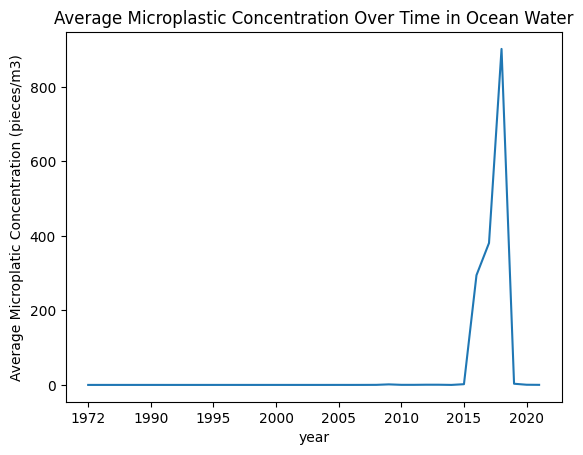

In [284]:
# Understand the change in microplastic concentration of ocean water over time
oceans = cleaned[cleaned['marine_setting'] == 'Ocean water']
oceans_year = oceans.groupby('year')['measurement'].mean()
oceans_year.plot()
plt.title('Average Microplastic Concentration Over Time in Ocean Water')
plt.ylabel('Average Microplatic Concentration (pieces/m3)');

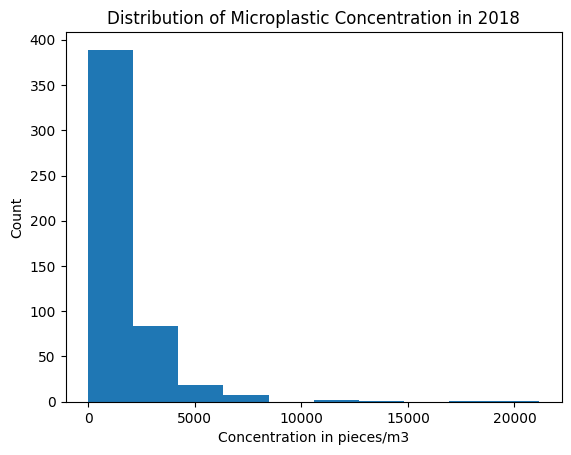

In [285]:
# There's a huge spike in microplastic concentration in 2018
# look at the distribution of microplastic concentration in 2018
y2018 = cleaned[cleaned['year'] == '2018']
y2018_m3 = y2018[y2018['unit'] == 'pieces/m3']
plt.hist(y2018_m3['measurement'])
plt.title('Distribution of Microplastic Concentration in 2018')
plt.xlabel('Concentration in pieces/m3')
plt.ylabel('Count');

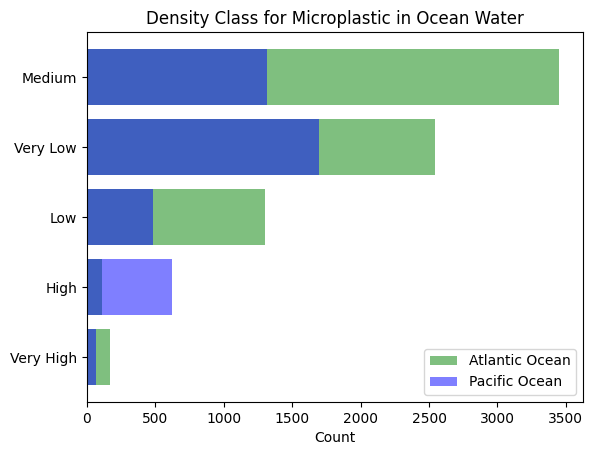

In [335]:
water = oceans.groupby('density_class')['oceans'].value_counts().unstack().reset_index()
water['Total'] = water['Atlantic Ocean'] + water['Pacific Ocean']
water = water.sort_values(by = 'Total')
plt.barh(water['density_class'], water['Atlantic Ocean'], label = 'Atlantic Ocean', color = 'green', alpha = 0.5)
plt.barh(water['density_class'], water['Pacific Ocean'], label = 'Pacific Ocean', color = 'blue', alpha = 0.5)
plt.legend()
plt.title('Density Class for Microplastic in Ocean Water');
plt.xlabel('Count');

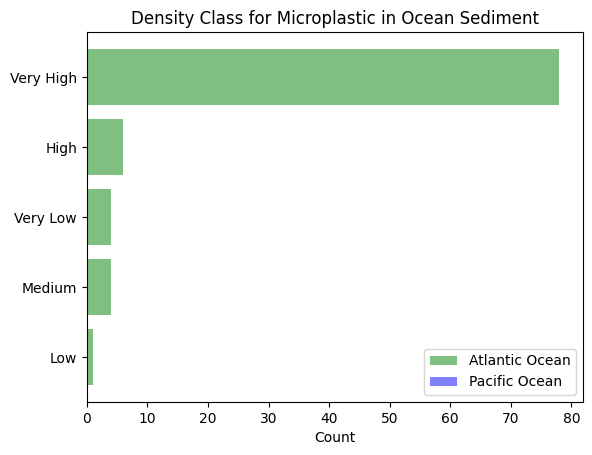

In [337]:
# look at the distribution of microplastics for ocean sediment
sediment = cleaned[cleaned['marine_setting'] == 'Ocean sediment']
sediment_grouped = sediment.groupby('density_class')['oceans'].value_counts().unstack().reset_index()
sediment_grouped = sediment_grouped.sort_values(by = 'Atlantic Ocean')
sediment_grouped['Pacific Ocean'] = [0, 0, 0, 0, 0]

plt.barh(sediment_grouped['density_class'], sediment_grouped['Atlantic Ocean'], label = 'Atlantic Ocean', color = 'green', alpha = 0.5)
plt.barh(sediment_grouped['density_class'], sediment_grouped['Pacific Ocean'], label = 'Pacific Ocean', color = 'blue', alpha = 0.5)
plt.title('Density Class for Microplastic in Ocean Sediment')
plt.legend(loc='lower right')
plt.xlabel('Count');

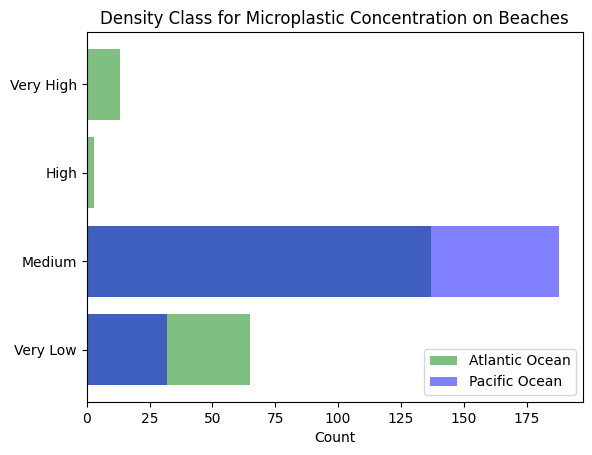

In [338]:
beach = cleaned[cleaned['marine_setting'].str.contains('Beach')]
beach_grouped = beach.groupby('density_class')['oceans'].value_counts().unstack().reset_index()
beach_grouped['Total'] = beach_grouped['Atlantic Ocean'] + beach_grouped['Pacific Ocean']
beach_grouped = beach_grouped.sort_values(by = 'Total')
plt.barh(beach_grouped['density_class'], beach_grouped['Atlantic Ocean'], label = 'Atlantic Ocean', color = 'green', alpha = 0.5)
plt.barh(beach_grouped['density_class'], beach_grouped['Pacific Ocean'], label = 'Pacific Ocean', color = 'blue', alpha = 0.5)
plt.title('Density Class for Microplastic Concentration on Beaches')
plt.legend()
plt.xlabel('Count');

In [325]:
beach_grouped

oceans,density_class,Atlantic Ocean,Pacific Ocean,Total
3,Very Low,65.0,32.0,97.0
1,Medium,137.0,188.0,325.0
0,High,3.0,NaN,NaN
2,Very High,13.0,NaN,NaN


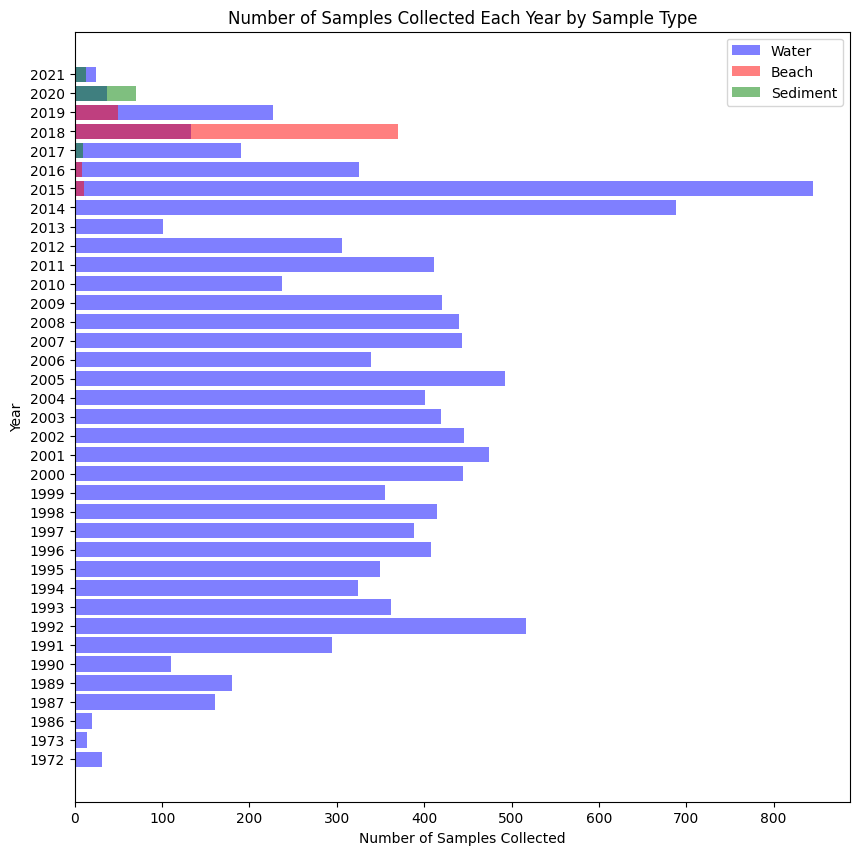

In [289]:
# look at how many samples of each type have been collected over time
w = oceans['year'].value_counts().to_frame().reset_index().sort_values(by = 'year')
b = beach['year'].value_counts().to_frame().reset_index().sort_values(by = 'year')
s = sediment['year'].value_counts().to_frame().reset_index().sort_values(by = 'year')


fig = plt.subplots(figsize =(10, 10)) 

plt.barh(w['year'], w['count'], color = 'blue', alpha = 0.5, label = 'Water')
plt.barh(b['year'], b['count'], color = 'red', alpha = 0.5, label = 'Beach')
plt.barh(s['year'], s['count'], color = 'green', alpha = 0.5, label = 'Sediment')
plt.legend()
plt.title('Number of Samples Collected Each Year by Sample Type')
plt.xlabel('Number of Samples Collected')
plt.ylabel('Year');

## Implementation of Isolation Forest
#### Looking for outliers based on location (longitude and latitude)

In [290]:
# initialize isolation forest
lat_long = cleaned[['latitude', 'longitude']]
forest = IsolationForest(n_estimators = 1000, contamination = 0.03, max_samples = 'auto')
prediction = forest.fit_predict(lat_long)
print(prediction[:20])
print("Number of outliers detected: {}".format(prediction[prediction < 0].sum()))
print("Number of normal samples detected: {}".format(prediction[prediction > 0].sum()))

# Get outliers and non-outliers
outliers = lat_long[prediction < 0]
normal = lat_long[prediction > 0]

[ 1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1]
Number of outliers detected: -370
Number of normal samples detected: 11933


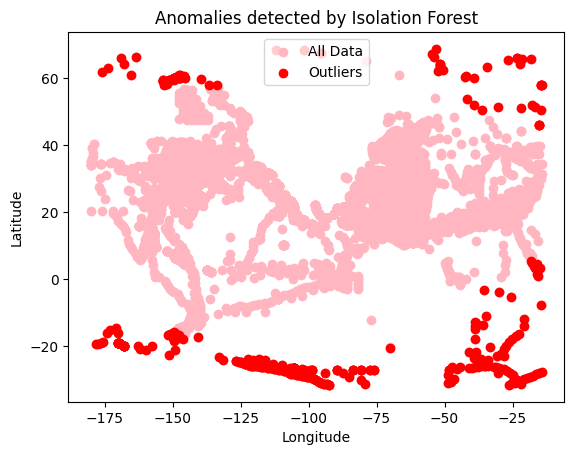

In [291]:
# Scatter Plot of all data points
plt.scatter(lat_long['longitude'], lat_long['latitude'], label='All Data', color = 'lightpink')

# Scatter Plot of outliers
plt.scatter(outliers['longitude'], outliers['latitude'], color='red', label='Outliers')

plt.title('Anomalies detected by Isolation Forest')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

In [292]:
# Map the outliers
map_center = [40.7128, -74.0060]  
map = folium.Map(location=map_center, zoom_start=2, tiles="openstreetmap")  

for index, row in outliers.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']], radius=2, color="red", fill_color="blue").add_to(map)

map


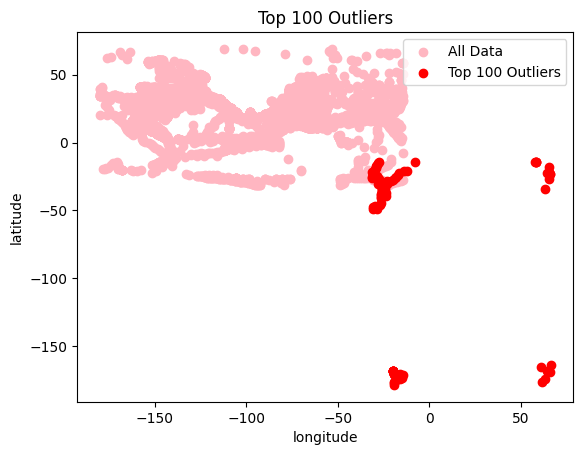

In [293]:
# Calculate anamoly scores to get top 100 outliers
score = forest.decision_function(lat_long)
df_scores = pd.DataFrame(list(zip(lat_long['latitude'],lat_long['longitude'],score)),columns = ['X','Y','Anomaly Score'])
top_100_outliers = df_scores.sort_values(by = ['Anomaly Score']).head(100)

# plot top 100 outliers
plt.scatter(lat_long['longitude'], lat_long['latitude'], label='All Data', color = 'lightpink')
plt.scatter(top_100_outliers['X'], top_100_outliers['Y'], label = 'Top 100 Outliers', c='red')
plt.title("Top 100 Outliers")
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.legend()
plt.show()

## K-Means Clustering by Location

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.1

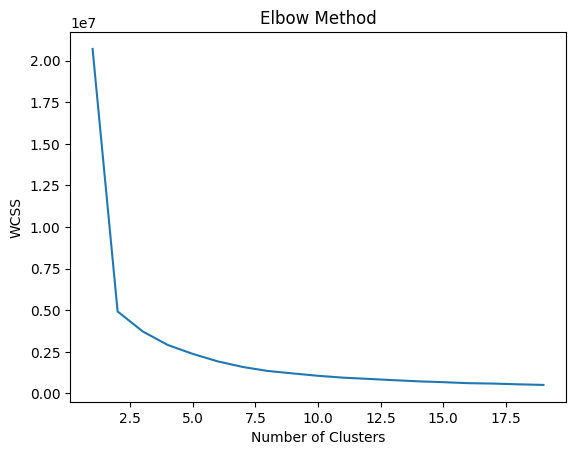

In [294]:
# Calculate WCSS for 1 to 20 clusters
wcss = [] # within-cluster sum of squares
for i in range(1,20):
    model = KMeans(n_clusters = i)
    y_kmeans = model.fit_predict(lat_long)
    wcss.append(model.inertia_)
    
# plot the graph number of clusters vs WCSS to determine best number of clusters
plt.plot(range(1,20), wcss)
plt.xlabel("Number of Clusters")
plt.ylabel("WCSS")
plt.title("Elbow Method")
plt.show()

In [295]:
# Use 7 clusters
model = KMeans(n_clusters = 7)
y_kmeans = model.fit_predict(lat_long)
cleaned['cluster'] = y_kmeans

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


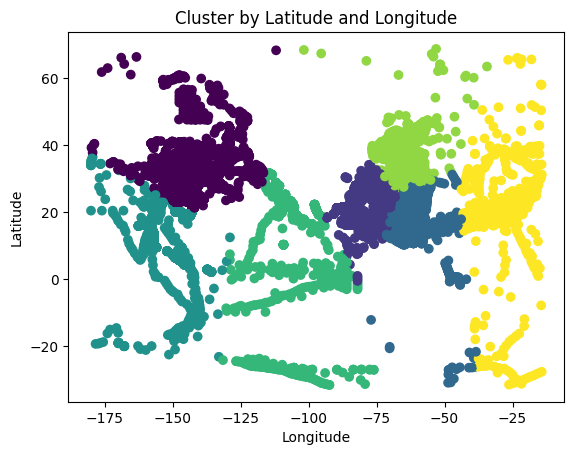

In [296]:
# Create a scatter plot of the clusters
plt.scatter(cleaned['longitude'], cleaned['latitude'], c = cleaned['cluster'])
plt.title('Cluster by Latitude and Longitude')
plt.xlabel('Longitude')
plt.ylabel('Latitude');

In [297]:
# Map the clusters
clusters1 = cleaned[['latitude', 'longitude']][cleaned['cluster']==0].values.tolist()
clusters2 = cleaned[['latitude', 'longitude']][cleaned['cluster']==1].values.tolist()
clusters3 = cleaned[['latitude', 'longitude']][cleaned['cluster']==2].values.tolist()
clusters4 = cleaned[['latitude', 'longitude']][cleaned['cluster']==3].values.tolist()
clusters5 = cleaned[['latitude', 'longitude']][cleaned['cluster']==4].values.tolist()
clusters6 = cleaned[['latitude', 'longitude']][cleaned['cluster']==5].values.tolist()
clusters7 = cleaned[['latitude', 'longitude']][cleaned['cluster']==6].values.tolist()
 
map2 = folium.Map(location = map_center, zoom_start = 2, titles = "openstreetmap")

for i in clusters1:
    folium.CircleMarker(i, radius = 2, color = "blue", fill_color = "blue").add_to(map2)

for i in clusters2:
    folium.CircleMarker(i, radius = 2, color = "red", fill_color = "red").add_to(map2)

for i in clusters3:
    folium.CircleMarker(i, radius = 2, color = "green", fill_color = "green").add_to(map2)

for i in clusters4:
    folium.CircleMarker(i, radius = 2, color = "teal", fill_color = "teal").add_to(map2)

for i in clusters5:
    folium.CircleMarker(i, radius = 2, color = "orange", fill_color = "orange").add_to(map2)

for i in clusters6:
    folium.CircleMarker(i, radius = 2, color = "purple", fill_color = "purple").add_to(map2)

for i in clusters7:
    folium.CircleMarker(i, radius = 2, color = "hotpink", fill_color = "hotpink").add_to(map2)

map2

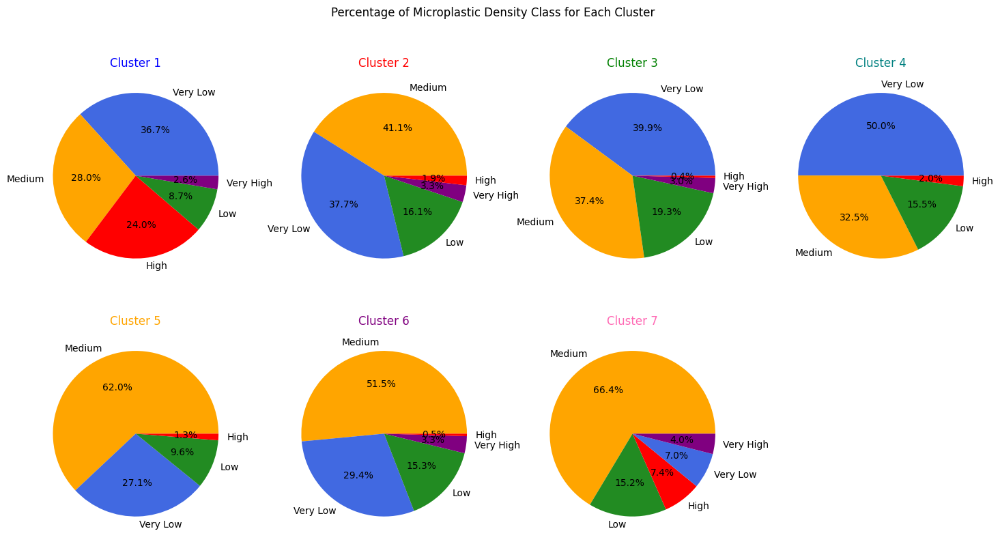

In [298]:
# Create data frames for each cluster
c1 = cleaned[cleaned['cluster'] == 0]
c2 = cleaned[cleaned['cluster'] == 1]
c3 = cleaned[cleaned['cluster'] == 2]
c4 = cleaned[cleaned['cluster'] == 3]
c5 = cleaned[cleaned['cluster'] == 4]
c6 = cleaned[cleaned['cluster'] == 5]
c7 = cleaned[cleaned['cluster'] == 6]

# Visualize the percentage of each microplastic concentration density class for each cluster
colors= {'Very Low':'royalblue', 
        'Low':'forestgreen',
        'Medium': 'orange',
        'High': 'red',
        'Very High': 'purple'}

fig, ax = plt.subplots(2, 4, figsize=(18,9))
c1['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0, 0], 
                                 colors=[colors[v] for v in c1['density_class'].value_counts().keys()]).set_title('Cluster 1', color = 'blue')
ax[0, 0].set_ylabel('')
c2['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0, 1], 
                                 colors=[colors[v] for v in c2['density_class'].value_counts().keys()]).set_title('Cluster 2', color = 'red')
ax[0, 1].set_ylabel('')
c3['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0, 2], 
                                 colors=[colors[v] for v in c3['density_class'].value_counts().keys()]).set_title('Cluster 3', color = 'green')
ax[0, 2].set_ylabel('')
c4['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0, 3], 
                                 colors=[colors[v] for v in c4['density_class'].value_counts().keys()]).set_title('Cluster 4', color = 'teal')
ax[0, 3].set_ylabel('')
c5['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1, 0], 
                                 colors=[colors[v] for v in c5['density_class'].value_counts().keys()]).set_title('Cluster 5', color = 'orange')
ax[1, 0].set_ylabel('')
c6['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1, 1], 
                                 colors=[colors[v] for v in c6['density_class'].value_counts().keys()]).set_title('Cluster 6', color = 'purple')
ax[1, 1].set_ylabel('')
c7['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1, 2], 
                                 colors=[colors[v] for v in c7['density_class'].value_counts().keys()]).set_title('Cluster 7', color = 'hotpink')
ax[1, 2].set_ylabel('')
fig.delaxes(ax=ax[1, 3])
fig.suptitle('Percentage of Microplastic Density Class for Each Cluster');

## Statistical Analysis

In [299]:
# Atlantic Ocean measurements with the unit pieces/m3
unit = cleaned[cleaned['unit'] == 'pieces/m3']
atlantic = unit[unit['oceans'] == 'Atlantic Ocean']

# Get latitude and longitude for each density class in the Atlantic Ocean
atlantic_vlow = atlantic[['latitude', 'longitude']][atlantic['density_class'] == 'Very Low'].values.tolist()
atlantic_low = atlantic[['latitude', 'longitude']][atlantic['density_class'] == 'Low'].values.tolist()
atlantic_medium = atlantic[['latitude', 'longitude']][atlantic['density_class'] == 'Medium'].values.tolist()
atlantic_high = atlantic[['latitude', 'longitude']][atlantic['density_class'] == 'High'].values.tolist()
atlantic_vhigh = atlantic[['latitude', 'longitude']][atlantic['density_class'] == 'Very High'].values.tolist()

# Pacifc Ocean measurements with the unit pieces/m3
pacific = unit[unit['oceans'] == 'Pacific Ocean']

# Get latitude and longitude for each density class in the Pacific Ocean
pacific_vlow = pacific[['latitude', 'longitude']][pacific['density_class'] == 'Very Low'].values.tolist()
pacific_low = pacific[['latitude', 'longitude']][pacific['density_class'] == 'Low'].values.tolist()
pacific_medium = pacific[['latitude', 'longitude']][pacific['density_class'] == 'Medium'].values.tolist()
pacific_high = pacific[['latitude', 'longitude']][pacific['density_class'] == 'High'].values.tolist()
pacific_vhigh = pacific[['latitude', 'longitude']][pacific['density_class'] == 'Very High'].values.tolist()

In [300]:
# Run a two-sample test

# calculate means
mean_a = atlantic['measurement'].mean()
mean_p = pacific['measurement'].mean()

# Run an F-test to determine if variances are similar

# calculate sample variance
var_a = np.var(atlantic['measurement'])
var_p = np.var(pacific['measurement'])

# calculate f-statistic
f_stat = var_a/var_p # larger variance goes in numerator

# calculate degrees of freedom
df_a = len(atlantic) - 1
df_p = len(pacific) - 1

# calculate p-value
p_value = stats.f.cdf(f_stat, df_a, df_p)
 
# Print the results
print('Degree of freedom Atlantic Ocean:',df_a)
print('Degree of freedom Pacific Ocean:',df_p)
print("F-statistic:", f_stat)
print("p-value:", p_value)

Degree of freedom Atlantic Ocean: 7787
Degree of freedom Pacific Ocean: 4404
F-statistic: 15.734530476116742
p-value: 0.9999999999999999


In [301]:
# we can assume that variances are equal since the p-value is above 0.05
print(stats.ttest_ind(a=atlantic['measurement'], b=pacific['measurement'], equal_var=True))
print('Mean concentration of microplastics in the Atlantic Ocean is: ', mean_a)
print('Mean concentration of microplastics in the Pacific Ocean is: ', mean_p)

TtestResult(statistic=2.606116938405403, pvalue=0.00916865578676254, df=12191.0)
Mean concentration of microplastics in the Atlantic Ocean is:  225.46990717706723
Mean concentration of microplastics in the Pacific Ocean is:  108.73929421021566


The p-value calculated from the two-sample test is 0.00917, which is less than our alpha level of 0.05. Therefore we can reject our null hypothesis that there is no difference in the average concentration of microplastics in the Atlantic and Pacific Ocean. Since the Pacific ocean has mean of 108.739 pieces/m3 and the Atlantic ocean has a mean of 225.470 pieces/m3, we can conclude that the Atlantic ocean has, on average, a higher concentration of microplastics.

In [313]:
# Create a map showing the density class for each collection in pieces/m3
map3 = folium.Map(location = map_center, zoom_start = 2)

# Atlantic Ocean
for i in atlantic_vlow:
    folium.CircleMarker(i, radius = 2, color = "mistyrose", fill_color = "mistyrose").add_to(map3)

for i in atlantic_low:
    folium.CircleMarker(i, radius = 2, color = "lightcoral", fill_color = "lightcoral").add_to(map3)

for i in atlantic_medium:
    folium.CircleMarker(i, radius = 2, color = "red", fill_color = "red").add_to(map3)

for i in atlantic_high:
    folium.CircleMarker(i, radius = 2, color = "firebrick", fill_color = "firebrick").add_to(map3)

for i in atlantic_vhigh:
    folium.CircleMarker(i, radius = 2, color = "maroon", fill_color = "maroon").add_to(map3)


# Pacfic Ocean
for i in pacific_vlow:
    folium.CircleMarker(i, radius = 2, color = "mistyrose", fill_color = "mistyrose").add_to(map3)

for i in pacific_low:
    folium.CircleMarker(i, radius = 2, color = "lightcoral", fill_color = "lightcoral").add_to(map3)

for i in pacific_medium:
    folium.CircleMarker(i, radius = 2, color = "red", fill_color = "red").add_to(map3)

for i in pacific_high:
    folium.CircleMarker(i, radius = 2, color = "firebrick", fill_color = "firebrick").add_to(map3)

for i in pacific_vhigh:
    folium.CircleMarker(i, radius = 2, color = "maroon", fill_color = "maroon").add_to(map3)

map3

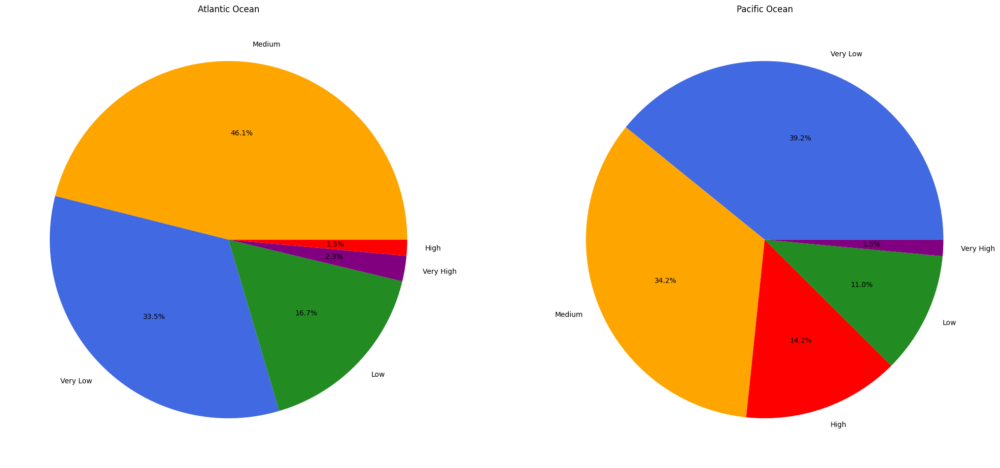

In [314]:
# visualize density classes between Atlantic vs Pacific Ocean
colors= {'Very Low':'royalblue', 
        'Low':'forestgreen',
        'Medium': 'orange',
        'High': 'red',
        'Very High': 'purple'}

fig1, ax1 = plt.subplots(1, 2, figsize = [25, 15])
atlantic['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax1[0], 
                                 colors=[colors[v] for v in atlantic['density_class'].value_counts().keys()]).set_title('Atlantic Ocean')
ax1[0].set_ylabel('')
pacific['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax1[1], 
                                 colors=[colors[v] for v in pacific['density_class'].value_counts().keys()]).set_title('Pacific Ocean')
ax1[1].set_ylabel('');

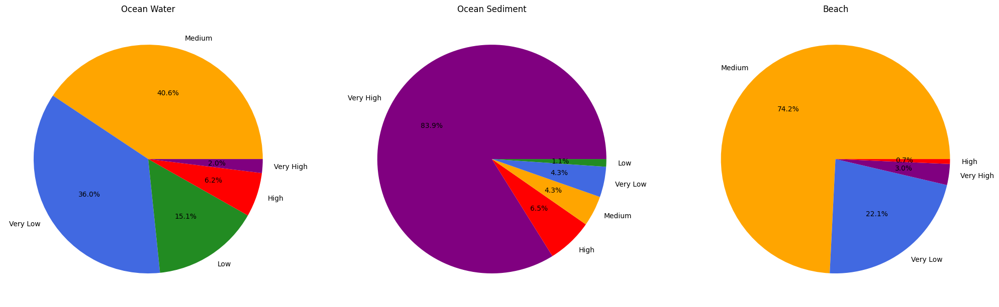

In [315]:
# Visualize density classes for each marine setting
colors= {'Very Low':'royalblue', 
        'Low':'forestgreen',
        'Medium': 'orange',
        'High': 'red',
        'Very High': 'purple'}

fig1, ax1 = plt.subplots(1, 3, figsize = [25, 15])
oceans['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax1[0], 
                                 colors=[colors[v] for v in oceans['density_class'].value_counts().keys()]).set_title('Ocean Water')
ax1[0].set_ylabel('')

sediment['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax1[1], 
                                 colors=[colors[v] for v in sediment['density_class'].value_counts().keys()]).set_title('Ocean Sediment')
ax1[1].set_ylabel('')

beach['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax1[2], 
                                 colors=[colors[v] for v in beach['density_class'].value_counts().keys()]).set_title('Beach')
ax1[2].set_ylabel('');

In [316]:
# Compare mean concentration for ocean water between the pacific and atlantic ocean
w_atlantic = oceans[oceans['oceans'] == 'Atlantic Ocean']
w_atlantic_mean = w_atlantic['measurement'].mean()

w_pacific = oceans[oceans['oceans'] == 'Pacific Ocean']
w_pacific_mean = w_pacific['measurement'].mean()

# Run an F-test to determine if variances are similar

# calculate sample variance
var_a_w = np.var(w_atlantic['measurement'])
var_p_w = np.var(w_pacific['measurement'])

# calculate f-statistic
f_stat = var_a_w/var_p_w # larger variance goes in numerator

# calculate degrees of freedom
df_a_w = len(w_atlantic) - 1
df_p_w = len(w_pacific) - 1

# calculate p-value
p_value = stats.f.cdf(f_stat, df_a_w, df_p_w)
 
# Print the results
print('Degree of freedom Atlantic Ocean water:',df_a_w)
print('Degree of freedom Pacific Ocean water:',df_p_w)
print("F-statistic:", f_stat)
print("p-value:", p_value)

Degree of freedom Atlantic Ocean water: 7569
Degree of freedom Pacific Ocean water: 4184
F-statistic: 12398.471393472208
p-value: 0.9999999999999999


In [317]:
# we can assume that variances are equal since the p-value is above 0.05
print(stats.ttest_ind(a=w_atlantic['measurement'], b=w_pacific['measurement'], equal_var=True))
print('Mean concentration of microplastics in the Atlantic Ocean water is: ', w_atlantic_mean)
print('Mean concentration of microplastics in the Pacific Ocean water is: ', w_pacific_mean)

TtestResult(statistic=7.32422254119796, pvalue=2.559857342107666e-13, df=11753.0)
Mean concentration of microplastics in the Atlantic Ocean water is:  38.062031863936596
Mean concentration of microplastics in the Pacific Ocean water is:  0.8791499622461171


The p-value of 2.559x10^-13 is smaller than the alpha level of 0.05, so the null hypothesis that the means are the same can be rejected. The water in the Atlantic Ocean has a higher mean of microplastic concentration than the Pacific Ocean.

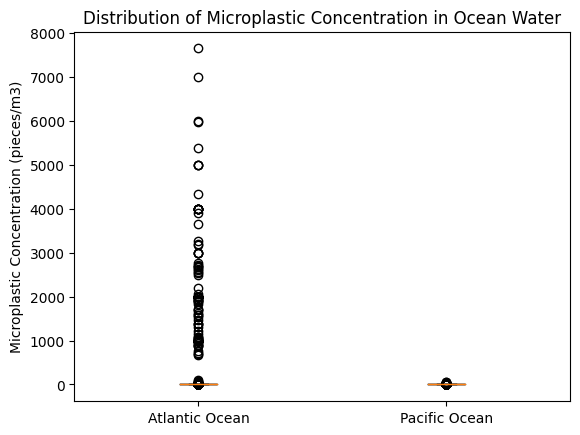

In [318]:
plt.boxplot([w_atlantic['measurement'], w_pacific['measurement']])
plt.xticks([1, 2], ['Atlantic Ocean', 'Pacific Ocean'])
plt.title('Distribution of Microplastic Concentration in Ocean Water') 
plt.ylabel('Microplastic Concentration (pieces/m3)');

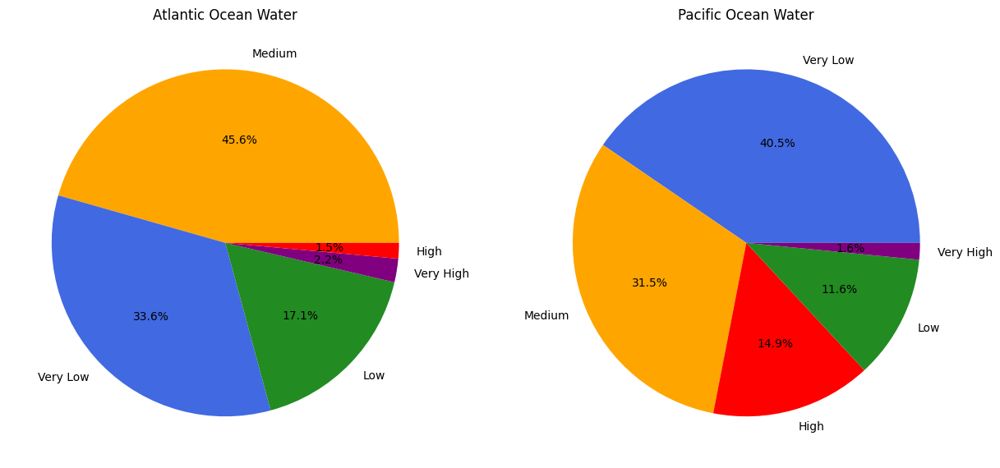

In [319]:
# Visualize density classes for each marine setting
colors= {'Very Low':'royalblue', 
        'Low':'forestgreen',
        'Medium': 'orange',
        'High': 'red',
        'Very High': 'purple'}

fig1, ax1 = plt.subplots(1, 2, figsize = [15, 10])
w_atlantic['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax1[0], 
                                 colors=[colors[v] for v in w_atlantic['density_class'].value_counts().keys()]).set_title('Atlantic Ocean Water')
ax1[0].set_ylabel('')

w_pacific['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax1[1], 
                                 colors=[colors[v] for v in w_pacific['density_class'].value_counts().keys()]).set_title('Pacific Ocean Water')
ax1[1].set_ylabel('');

In [321]:
# Compare mean concentration for Beaches in the pacific and atlantic ocean
b_pacific = beach[beach['oceans'] == 'Pacific Ocean']
b_pacific = b_pacific[b_pacific['unit'] == 'pieces/m3']
b_atlantic = beach[beach['oceans'] == 'Atlantic Ocean']
b_atlantic = b_atlantic[b_atlantic['unit'] == 'pieces/m3']

b_atlantic_mean = b_atlantic['measurement'].mean()
b_pacific_mean = b_pacific['measurement'].mean()

# Run an F-test to determine if variances are similar

# calculate sample variance
var_a_b = np.var(b_atlantic['measurement'])
var_p_b = np.var(b_pacific['measurement'])

# calculate f-statistic
f_stat = var_a_b/var_p_b # larger variance goes in numerator

# calculate degrees of freedom
df_a_b = len(b_atlantic) - 1
df_p_b = len(b_pacific) - 1

# calculate p-value
p_value = stats.f.cdf(f_stat, df_a_b, df_p_b)
 
# Print the results
print('Degree of freedom Atlantic Ocean water:',df_a_b)
print('Degree of freedom Pacific Ocean water:',df_p_b)
print("F-statistic:", f_stat)
print("p-value:", p_value)

# we can assume that variances are equal since the p-value is above 0.05
print(stats.ttest_ind(a=b_atlantic['measurement'], b=b_pacific['measurement'], equal_var=True))
print('Mean concentration of microplastics on the Atlantic Ocean beaches is: ', b_atlantic_mean)
print('Mean concentration of microplastics on the Pacific Ocean beaches is: ', b_pacific_mean)

Degree of freedom Atlantic Ocean water: 217
Degree of freedom Pacific Ocean water: 219
F-statistic: 40.07654764183674
p-value: 0.9999999999999999
TtestResult(statistic=4.165641922087394, pvalue=3.744447260353878e-05, df=436.0)
Mean concentration of microplastics on the Atlantic Ocean beaches is:  6733.16539396789
Mean concentration of microplastics on the Pacific Ocean beaches is:  2160.5334018363637


The p-value of 3.744x10^-5 is smaller than the alpha level of 0.5, so the null hypothesis that the means are equal can be rejected. 

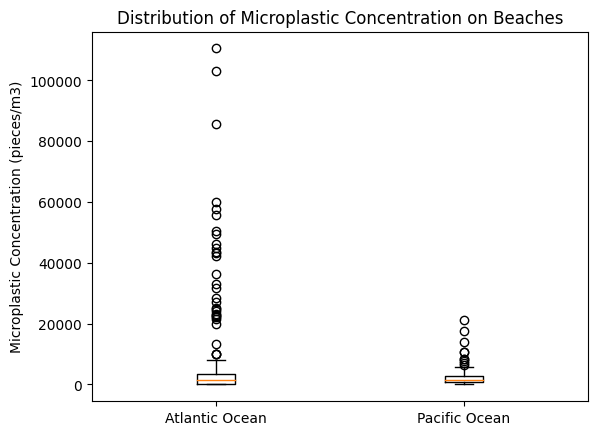

In [322]:
# plot distribution of microplastic concentration on beaches
plt.boxplot([b_atlantic['measurement'], b_pacific['measurement']])
plt.xticks([1, 2], ['Atlantic Ocean', 'Pacific Ocean'])
plt.title('Distribution of Microplastic Concentration on Beaches') 
plt.ylabel('Microplastic Concentration (pieces/m3)');

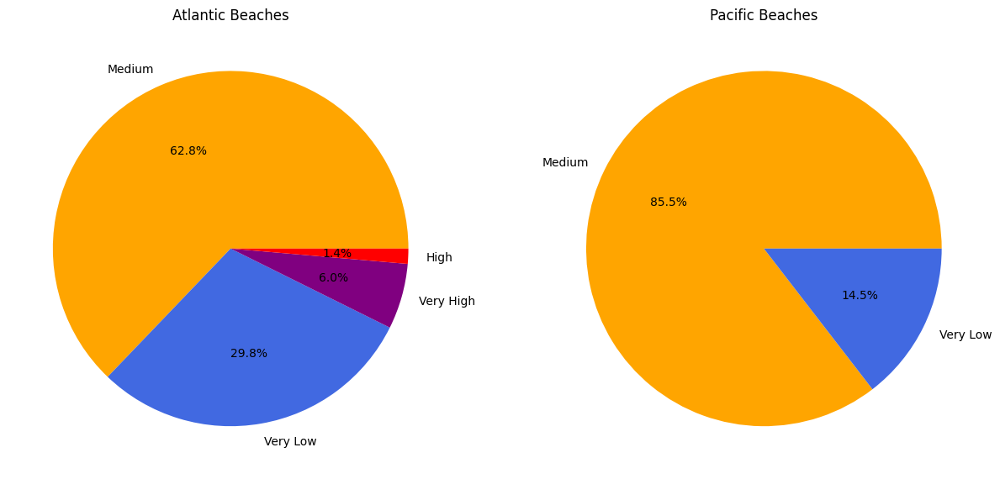

In [323]:
# Visualize density classes for each marine setting
colors= {'Very Low':'royalblue', 
        'Low':'forestgreen',
        'Medium': 'orange',
        'High': 'red',
        'Very High': 'purple'}

fig1, ax1 = plt.subplots(1, 2, figsize = [15, 10])
b_atlantic['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax1[0], 
                                 colors=[colors[v] for v in b_atlantic['density_class'].value_counts().keys()]).set_title('Atlantic Beaches')
ax1[0].set_ylabel('')

b_pacific['density_class'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax1[1], 
                                 colors=[colors[v] for v in b_pacific['density_class'].value_counts().keys()]).set_title('Pacific Beaches')
ax1[1].set_ylabel('');